# **<font color="#ffb94f">0.0 PREPARATION</font>**

In [1]:
# In case of running on Google Colab
%%capture

# !apt-get install -qq curl g++ make
# !curl -L http://download.osgeo.org/libspatialindex/spatialindex-src-1.8.5.tar.gz | tar xz
# import os
# os.chdir('spatialindex-src-1.8.5')|
# !./configure
# !make
# !make install
# !pip install rtree
# !ldconfig
# !pip install scikit-mobility

In [2]:
%%capture
# Importing libraries
import numpy as np
import random
import pandas as pd
import datetime
import collections
from sklearn.impute import SimpleImputer

# Data visualization
import matplotlib.pyplot as plt
import matplotlib.patches
import matplotlib.ticker as ticker
import plotly
import plotly.graph_objects as go
import seaborn as sns

# Geospatial analysis
!pip install geovoronoi
!pip install geopandas
!pip install folium
import geopandas as gpd
import folium
from scipy.stats import gaussian_kde, iqr
from scipy.spatial import Voronoi, voronoi_plot_2d
from geovoronoi import voronoi_regions_from_coords, points_to_coords
from shapely.geometry import MultiPolygon, Polygon, Point
from shapely.ops import unary_union

# Outlier Detection
from sklearn.cluster import DBSCAN
from sklearn.neighbors import LocalOutlierFactor, NearestNeighbors
from sklearn.ensemble import IsolationForest

# Dimensionality Reduction
from sklearn.feature_selection import VarianceThreshold, SelectKBest, SelectFromModel, chi2
from sklearn.decomposition import PCA
from sklearn import random_projection

# import skmob
# from skmob.tessellation import tilers
# from skmob.models.epr import DensityEPR, SpatialEPR, Ditras
# from skmob.models.markov_diary_generator import MarkovDiaryGenerator
# from skmob.preprocessing import filtering, compression, detection, clustering
# from skmob.measures.individual import jump_lengths, radius_of_gyration, uncorrelated_entropy, number_of_locations, number_of_visits, location_frequency
# from skmob.measures.collective import visits_per_location
# from skmob.utils.plot import *
# from skmob.data.load import load_dataset, list_datasets

# import sklearn
# from sklearn.metrics import mean_squared_error

In [3]:
# Setting up plot style
sns.set_context(font_scale=2, rc={"font.size":10,"axes.titlesize":16,"axes.labelsize":14})
sns.set_style("whitegrid", {'grid.linestyle': '--', 'alpha': 0.25})
sns.set_style({'font.family':'serif', 'font.serif':'Computer Modern'})

# **<font color="#ffb94f">1.0 DATA UNDERSTANDING & PREPARATION</font>**

## **<font color="#84f745">1.1 DATA UNDERSTANDING</font>**

In [4]:
# Taking a first look at the dataset
air_quality_index = 'https://raw.githubusercontent.com/Bruno-Limon/air-quality-analysis/main/AQI-2016.csv'
df_aqi = pd.read_csv(air_quality_index)

df_aqi.head()

,Fecha,Hora,CO,NO2,O3,PM 10,SO2,PM2.5,Temperatura,Humedad relativa,Velocidad de viento,Direccion de vientos,Radiacion solar,Indice UV,CASETA
0,01/01/2016,0:00:00,1.471,0.02763,0.00472,146.95,0.00306,NaN,18.3,70.3,2.2,270.3,NaN,NaN,ATM
1,01/01/2016,1:00:00,2.653,0.02632,0.00335,216.10,0.00322,NaN,17.3,74.2,0.4,219.5,NaN,NaN,ATM
2,01/01/2016,2:00:00,2.712,0.02698,0.00328,113.44,0.00305,NaN,16.7,76.4,0.6,215.5,NaN,NaN,ATM
3,01/01/2016,3:00:00,2.099,0.02398,0.00348,73.30,0.00259,NaN,16.1,78.4,1.7,250.9,NaN,NaN,ATM
4,01/01/2016,4:00:00,2.019,0.02110,0.00323,52.55,0.00220,NaN,15.7,79.8,0.2,180.6,NaN,NaN,ATM


In [5]:
df_aqi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87840 entries, 0 to 87839
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Fecha                  87840 non-null  object 
 1   Hora                   87840 non-null  object 
 2   CO                     77138 non-null  float64
 3   NO2                    78519 non-null  float64
 4   O3                     78647 non-null  float64
 5   PM 10                  45142 non-null  float64
 6   SO2                    57942 non-null  float64
 7   PM2.5                  7459 non-null   float64
 8   Temperatura            69318 non-null  float64
 9   Humedad relativa       78099 non-null  float64
 10  Velocidad de viento    86852 non-null  float64
 11  Direccion de vientos   78410 non-null  float64
 12  Radiacion solar        26295 non-null  float64
 13  Indice UV              8784 non-null   float64
 14  CASETA                 87840 non-null  object 
dtypes:

In [6]:
# Creating datetime column using date and hour columns
df_aqi.insert(0, 'Datetime', pd.to_datetime(df_aqi['Fecha'] + ' ' + df_aqi['Hora']))
df_aqi.drop(['Fecha', 'Hora'], axis = 1, inplace = True)

# Looking at unique values and time span
print('Distinct monitoring stations:', df_aqi['CASETA '].unique())
print('Earliest date:', df_aqi['Datetime'].min())
print('Latest date:', df_aqi['Datetime'].max())

Distinct monitoring stations: ['ATM' 'OBL' 'PIN' 'SFE' 'TLA' 'VAL' 'CEN' 'AGU' 'LDO' 'MIR']
Earliest date: 2016-01-01 00:00:00
Latest date: 2016-12-31 23:00:00


In [7]:
# Mapping the 3 letter code of monitoring stations to their full name, for clarity
dict_caseta = {'ATM': 'Atemajac',
               'OBL': 'Oblatos', 
               'PIN': 'Las Pintas', 
               'SFE': 'Santa Fe', 
               'TLA': 'Tlaquepaque', 
               'VAL': 'Vallarta', 
               'CEN': 'Centro',
               'AGU': 'Las Aguilas',
               'LDO': 'Loma Dorada',
               'MIR': 'Miravalle',}

df_aqi["Caseta"] = df_aqi['CASETA '].map(dict_caseta)
df_aqi.drop(['CASETA '], axis = 1, inplace = True)

MISSING DATA

In [8]:
# Looking at the amount of null values across features
print(df_aqi.isnull().sum(axis = 0))

# Dropping unncessary features or those with over 50% missing values
to_drop = ['PM2.5 ', 'Radiacion solar', 'Indice UV', 'Direccion de vientos ']
df_aqi.drop(to_drop, axis = 1, inplace = True)
df_aqi.rename(columns={'Humedad relativa ':'Humidity', 
                       'Velocidad de viento ':'Wind velocity',
                       'Caseta':'Station',
                       'Temperatura':'Temperature'}, inplace=True)

Datetime                     0
CO                       10702
NO2                       9321
O3                        9193
PM 10                    42698
SO2                      29898
PM2.5                    80381
Temperatura              18522
Humedad relativa          9741
Velocidad de viento        988
Direccion de vientos      9430
Radiacion solar          61545
Indice UV                79056
Caseta                       0
dtype: int64


In [9]:
list_monitor_station = list(df_aqi['Station'].unique())
list_columns = list(df_aqi.columns.values)

# Creating list containing null values filtered by the monitoring station
list_nulls = []
for i, station in enumerate(list_monitor_station):
    list_nulls.append([])
    for j in range(df_aqi.shape[1]):
        list_nulls[i].append(df_aqi.loc[df_aqi['Station'] == station].iloc[:,j].isnull().sum())

# Putting the lists into a dataframe
df_aqi_nulls = pd.DataFrame(np.column_stack([list_nulls[i] for i in range(len(list_nulls))]),
                            columns = list_monitor_station,
                            index = list_columns)
df_aqi_nulls.T

,Datetime,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity,Station
Atemajac,0,605,604,929,5241,671,73,73,73,0
Oblatos,0,457,553,533,5032,566,16,16,16,0
Las Pintas,0,1479,1002,936,3341,7838,6,6,6,0
Santa Fe,0,1077,986,1381,1305,6486,8784,8784,31,0
Tlaquepaque,0,489,475,646,4911,477,70,70,70,0
Vallarta,0,1176,554,412,4901,2555,20,20,20,0
Centro,0,3024,391,640,4977,1142,8784,3,3,0
Las Aguilas,0,372,1507,358,5140,3955,5,5,5,0
Loma Dorada,0,310,922,1071,1166,2844,422,422,422,0
Miravalle,0,1713,2327,2287,6684,3364,342,342,342,0


As seen from the previous dataframe, some monitoring stations must have had some sensors not functioning thruoughout the year, such as temperature and humidity in the "Santa Fe" station, since every value concerning them is missing.

This might make these stations useless for some of the analysis and algorithms applied to the data

In [10]:
# Dealing with missing values with different methods, imputing with mean, median, forward filling and dropping them altogether
df_aqi_imputed1 = df_aqi.fillna(df_aqi.mean())
df_aqi_imputed2 = df_aqi.fillna(df_aqi.median())
df_aqi_imputed3 = df_aqi.fillna(method = "ffill")
df_aqi_dropna = df_aqi.dropna()

<ipython-input-10-907bfc08b594>:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df_aqi_imputed1 = df_aqi.fillna(df_aqi.mean())
<ipython-input-10-907bfc08b594>:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_aqi_imputed1 = df_aqi.fillna(df_aqi.mean())
<ipython-input-10-907bfc08b594>:3: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df_aqi_imputed2 = df_aqi.fillna(df_aqi.median())
<ipython-input-10-907bfc08b594>:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduct

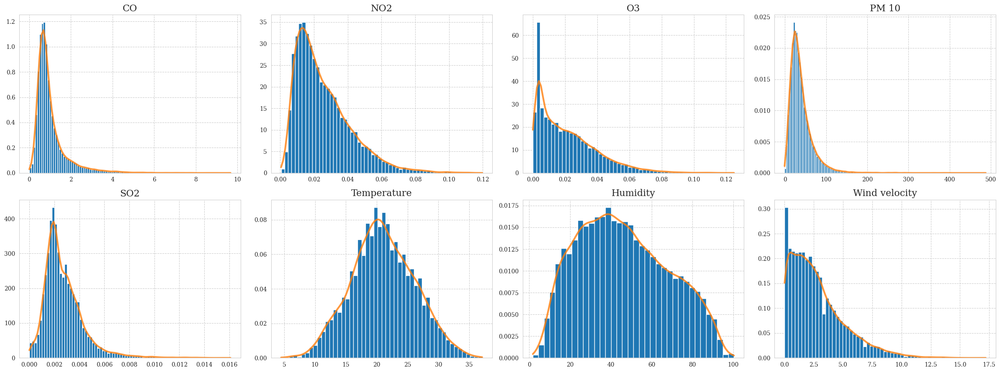

In [11]:
list_columns = list(df_aqi.columns.values)[1:9]
list_values_dropna = [df_aqi_dropna.iloc[:,i].values for i in range(1,9)]
list_imputed_values1 = [df_aqi_imputed1.iloc[:,i].values for i in range(1,9)]
list_imputed_values2 = [df_aqi_imputed2.iloc[:,i].values for i in range(1,9)]
list_imputed_values3 = [df_aqi_imputed3.iloc[:,i].values for i in range(1,9)]

# Obtaining distribution of each feature using KDE method
list_x = []
list_y = []
list_x1 = []
list_y1 = []
list_x2 = []
list_y2 = []
list_x3 = []
list_y3 = []

for i in range(len(list_values_dropna)):
    kde = gaussian_kde(list_values_dropna[i])
    x = np.linspace(min(list_values_dropna[i]), max(list_values_dropna[i]), 100)
    list_x.append(x)
    list_y.append(kde(x))

    kde1 = gaussian_kde(list_imputed_values1[i])
    x1 = np.linspace(min(list_imputed_values1[i]), max(list_imputed_values1[i]), 100)
    list_x1.append(x1)
    list_y1.append(kde1(x1))

    kde2 = gaussian_kde(list_imputed_values2[i])
    x2 = np.linspace(min(list_imputed_values2[i]), max(list_imputed_values2[i]), 100)
    list_x2.append(x2)
    list_y2.append(kde2(x2))

    kde3 = gaussian_kde(list_imputed_values3[i])
    x3 = np.linspace(min(list_imputed_values3[i]), max(list_imputed_values3[i]), 100)
    list_x3.append(x3)
    list_y3.append(kde3(x3))

# Plotting histogram for each feature in dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].hist(list_values_dropna[k], bins = 'scott', density = True)
        ax[i,j].plot(list_x[k], list_y[k], linewidth = 3, alpha = .8)
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

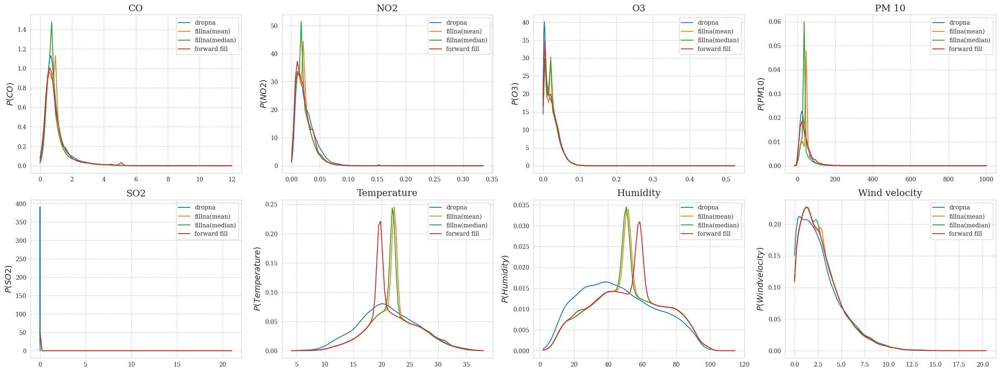

In [12]:
# Plotting distributions
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].plot(list_x[k], list_y[k], label = 'dropna')
        ax[i,j].plot(list_x1[k], list_y1[k], label = 'fillna(mean)')
        ax[i,j].plot(list_x2[k], list_y2[k], label = 'fillna(median)')
        ax[i,j].plot(list_x3[k], list_y3[k], label = 'forward fill')
        ax[i,j].legend(loc = 'best')
        ax[i,j].set(title = list_columns[k])
        ax[i,j].set(ylabel = "$P({})$".format(list_columns[k]))
        fig.tight_layout()
        k += 1

Looking at the comparison of different methods to deal with missing values, forward filling seems to be closer to the distribution of the values omitting NA, such is the case for the 1st 4 features for example, then, when looking at temperature and humidity, we get confirmation of the undesirable effects that imputing a large amount of values can heavily bias the distribution, by adding synthetic density into the mean areas of the distribution

Another interesting thing to note is that the distribution of SO2 went from a range of 0-0.016 when omitting nan values to 0-20 when imputing said values, given the orders of magnitude of this change, it might prove to be an anomaly

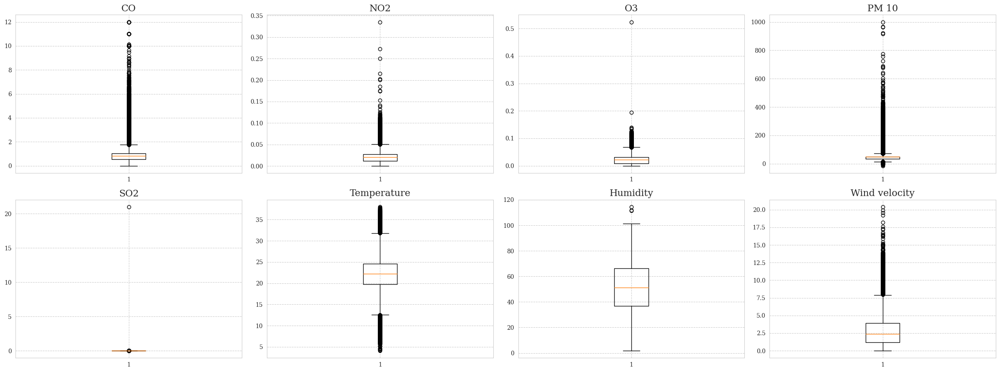

In [13]:
# Plotting histogram for each feature in dataset of values imputed with the mean to look deeper into the SO2 anomaly
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].boxplot(list_imputed_values1[k])
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

In [14]:
# Intuition was correct, SO2 contains a single outlier that completely skews the distribution
# To get a confirmation, we look at the 5 largest values of SO2
print('Top 5 SO2 values\n', df_aqi['SO2'].nlargest(5), '\n', sep="")
print('Top 5 O3 values\n', df_aqi['O3'].nlargest(5), sep="")

Top 5 SO2 values
43816    21.00000
19798     0.02722
27165     0.02147
26864     0.01973
79988     0.01933
Name: SO2, dtype: float64

Top 5 O3 values
14554    0.52392
54498    0.19370
56560    0.13908
21422    0.13695
56559    0.13385
Name: O3, dtype: float64


In [15]:
%%capture
# Removing the monitoring stations with features consisting entirely of missing values as well as the anomaly in SO2
df_aqi_clean = df_aqi[df_aqi.Station.str.contains('Santa Fe|Centro') == False]
df_aqi_clean = df_aqi_clean.drop([43816, 14554])

# Re-imputing the values with the new clean dataset
df_aqi_imputed1 = df_aqi_clean.fillna(df_aqi_clean.mean())
df_aqi_imputed2 = df_aqi_clean.fillna(df_aqi_clean.median())
df_aqi_imputed3 = df_aqi_clean.fillna(method = "ffill")
df_aqi_dropna = df_aqi_clean.dropna()

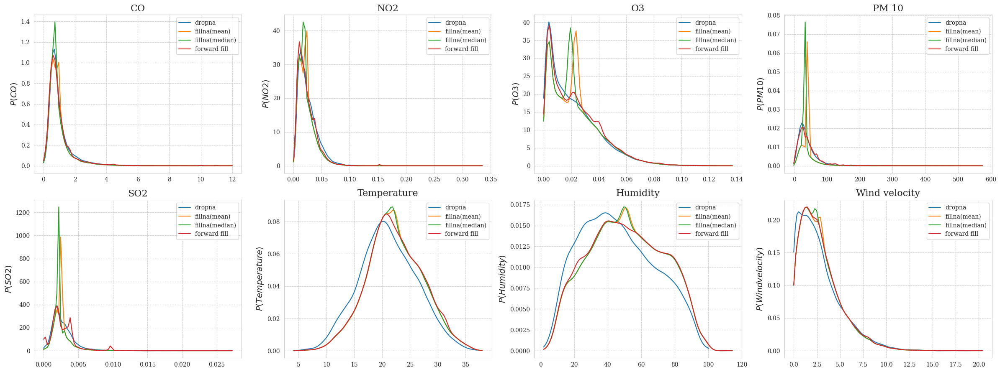

In [16]:
# Repeating the distribution comparison to see the effects of the recent cleaning
list_columns = list(df_aqi.columns.values)[1:9]
list_values_dropna = [df_aqi_dropna.iloc[:,i].values for i in range(1,9)]
list_imputed_values1 = [df_aqi_imputed1.iloc[:,i].values for i in range(1,9)]
list_imputed_values2 = [df_aqi_imputed2.iloc[:,i].values for i in range(1,9)]
list_imputed_values3 = [df_aqi_imputed3.iloc[:,i].values for i in range(1,9)]

# Obtaining distribution of each feature using KDE method
list_x = []
list_y = []
list_x1 = []
list_y1 = []
list_x2 = []
list_y2 = []
list_x3 = []
list_y3 = []

for i in range(len(list_values_dropna)):
    kde = gaussian_kde(list_values_dropna[i])
    x = np.linspace(min(list_values_dropna[i]), max(list_values_dropna[i]), 100)
    list_x.append(x)
    list_y.append(kde(x))

    kde1 = gaussian_kde(list_imputed_values1[i])
    x1 = np.linspace(min(list_imputed_values1[i]), max(list_imputed_values1[i]), 100)
    list_x1.append(x1)
    list_y1.append(kde1(x1))

    kde2 = gaussian_kde(list_imputed_values2[i])
    x2 = np.linspace(min(list_imputed_values2[i]), max(list_imputed_values2[i]), 100)
    list_x2.append(x2)
    list_y2.append(kde2(x2))

    kde3 = gaussian_kde(list_imputed_values3[i])
    x3 = np.linspace(min(list_imputed_values3[i]), max(list_imputed_values3[i]), 100)
    list_x3.append(x3)
    list_y3.append(kde3(x3))

# Plotting distributions
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].plot(list_x[k], list_y[k], label = 'dropna')
        ax[i,j].plot(list_x1[k], list_y1[k], label = 'fillna(mean)')
        ax[i,j].plot(list_x2[k], list_y2[k], label = 'fillna(median)')
        ax[i,j].plot(list_x3[k], list_y3[k], label = 'forward fill')
        ax[i,j].legend(loc = 'best')
        ax[i,j].set(title = list_columns[k])
        ax[i,j].set(ylabel = "$P({})$".format(list_columns[k]))
        fig.tight_layout()  
        k += 1

The peaks in the temperature and humidity distributions have disappeared and the SO2 distribution got rid of the outlier, now it is clear that the dataset produced with forward filling imputing might be the best candidate to capture the underlying data distribution while maintining a decent amount of data

In [17]:
# Assigning the final dataset to be used
df_aqi = df_aqi_imputed3.reset_index()
df_aqi = df_aqi.drop('index', axis = 1)

X_train = df_aqi.iloc[:,1:9]
X_train_dropna = df_aqi_dropna.iloc[:,1:9]

df_aqi.describe()

,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
count,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000
mean,0.979176,0.023547,0.022835,41.278703,0.002721,22.324553,50.909517,2.884360
std,0.829328,0.016594,0.018478,33.190197,0.001800,5.028176,22.022045,2.176346
min,0.002100,0.000550,0.000000,-1.090000,0.000000,4.100000,1.800000,0.000000
25%,0.531000,0.011670,0.006920,20.980000,0.001640,19.000000,33.700000,1.300000
50%,0.760000,0.019730,0.019480,32.760000,0.002300,22.000000,50.100000,2.500000
75%,1.120000,0.031470,0.033877,51.370000,0.003640,25.800000,68.500000,4.000000
max,12.000000,0.335270,0.136950,574.750000,0.027220,38.000000,114.400000,20.400000


In [ ]:
# Creating correlation matrix with pandas built-in methods
aqi_corr = df_aqi.corr()
aqi_corr.style.background_gradient(cmap='RdBu', axis=None).set_precision(2)

<ipython-input-28-46ab2a8154fe>:3: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  aqi_corr.style.background_gradient(cmap='RdBu', axis=None).set_precision(2)


,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
CO,1.00,0.51,-0.35,0.27,0.28,-0.27,0.06,-0.27
NO2,0.51,1.00,-0.38,0.24,0.20,-0.30,-0.05,-0.31
O3,-0.35,-0.38,1.00,-0.13,-0.13,0.64,-0.49,0.39
PM 10,0.27,0.24,-0.13,1.00,0.26,-0.03,-0.09,-0.13
SO2,0.28,0.20,-0.13,0.26,1.00,-0.09,-0.09,-0.22
Temperature,-0.27,-0.30,0.64,-0.03,-0.09,1.00,-0.51,0.42
Humidity,0.06,-0.05,-0.49,-0.09,-0.09,-0.51,1.00,-0.36
Wind velocity,-0.27,-0.31,0.39,-0.13,-0.22,0.42,-0.36,1.00


In [ ]:
X_train = df_aqi.iloc[:,1:9]

## **<font color="#84f745">1.2 OUTLIER DETECTION</font>**

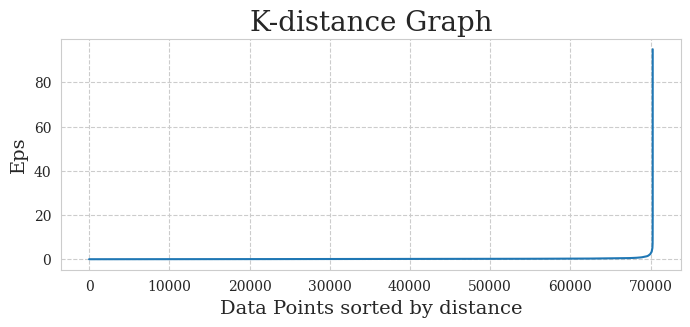

In [18]:
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)

# Calcoliamo i valori di distanza tra ogni record e il suo nearest neighbor
nbr = NearestNeighbors(n_neighbors=2)
nbrs = nbr.fit(X_train_pca)
distances, indices = nbrs.kneighbors(X_train_pca)

# Plottiamo la distanza dentro i valori del df e cerchiamo il "gomito" per vedere il punto di massima curvatura e quindi il valore ottimo di Eps
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(8,3))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Eps',fontsize=14)
plt.show()

Outliers found by DBSCAN: 279


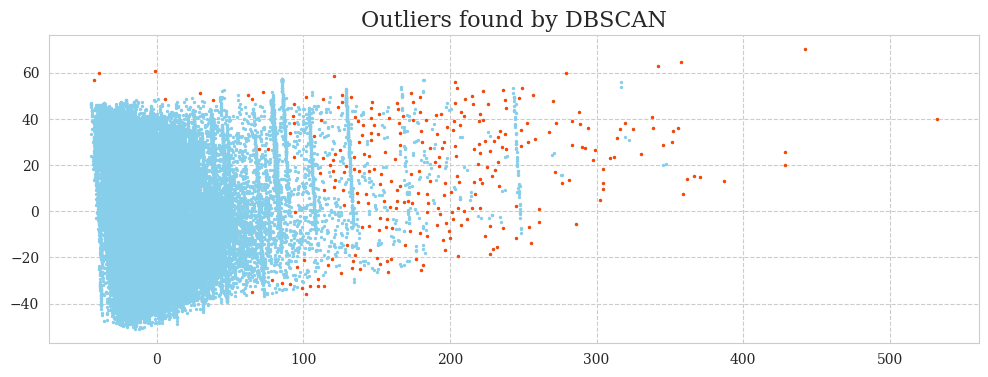

In [19]:
dbscan = DBSCAN(eps = 2.5, min_samples = 2)
dbscan.fit(X_train_pca)

anomalies_db = np.where(dbscan.labels_ == -1)
anomalies_db_pca = X_train_pca[anomalies_db]
print('Outliers found by DBSCAN:', len(anomalies_db_pca))

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_db_pca[:,0], anomalies_db_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by DBSCAN")
plt.show()

Outliers found by Isolation Forest: 211


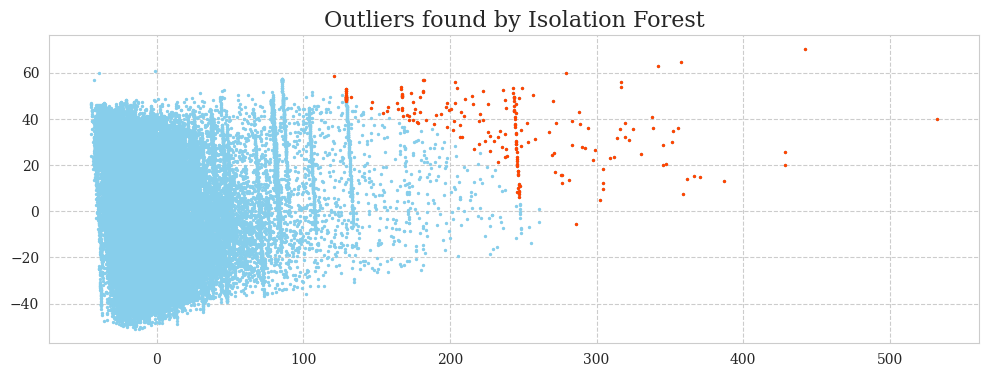

In [20]:
isol = IsolationForest(bootstrap = True,  
                       contamination = 0.003, 
                       max_samples = 200, 
                       n_estimators = 1000, 
                       n_jobs = -1).fit(X_train_pca)

outliers_isol = isol.predict(X_train_pca)

anomalies_isol = np.where(outliers_isol == -1)
anomalies_isol_pca = X_train_pca[anomalies_isol]
print('Outliers found by Isolation Forest:', len(anomalies_isol_pca))

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color='skyblue', s = 2)
plt.scatter(anomalies_isol_pca[:,0], anomalies_isol_pca[:,1], color='orangered', s = 2)
plt.title("Outliers found by Isolation Forest")
plt.show()

Outliers found by LOF: 211


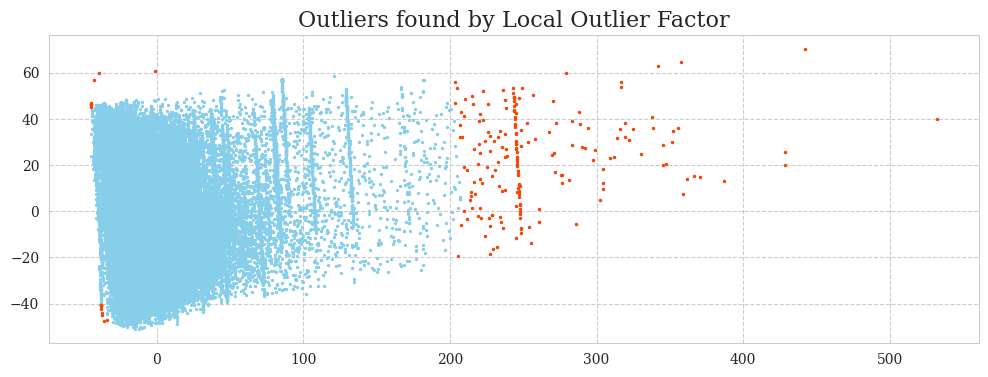

In [21]:
lof = LocalOutlierFactor(n_neighbors = 1000,
                         contamination = .003,
                         algorithm = 'kd_tree')

outliers_lof = lof.fit_predict(X_train_pca)

anomalies_lof = np.where(outliers_lof == -1)
anomalies_lof_pca = X_train_pca[anomalies_lof]
print('Outliers found by LOF:', len(anomalies_lof_pca))

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_lof_pca[:,0], anomalies_lof_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by Local Outlier Factor")
plt.show()

Final outliers: 211


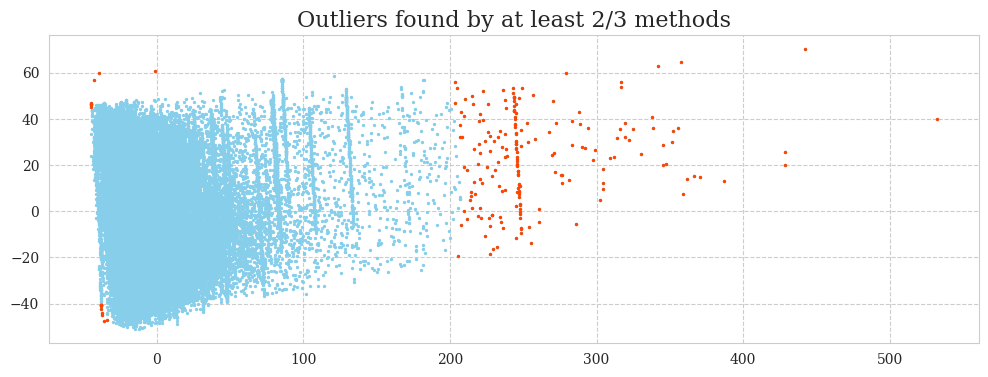

In [22]:
list_all_outliers = []
for i,j,k in zip(anomalies_db, anomalies_lof, anomalies_lof):
    list_all_outliers.extend(i)
    list_all_outliers.extend(j)
    list_all_outliers.extend(k)

list_final_outliers = []
for item, count in collections.Counter(list_all_outliers).items(): 
    if count >= 2:
        list_final_outliers.append(item)

anomalies_final_pca = X_train_pca[list_final_outliers]
print('Final outliers:', len(anomalies_final_pca))

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_final_pca[:,0], anomalies_final_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by at least 2/3 methods")
plt.show()

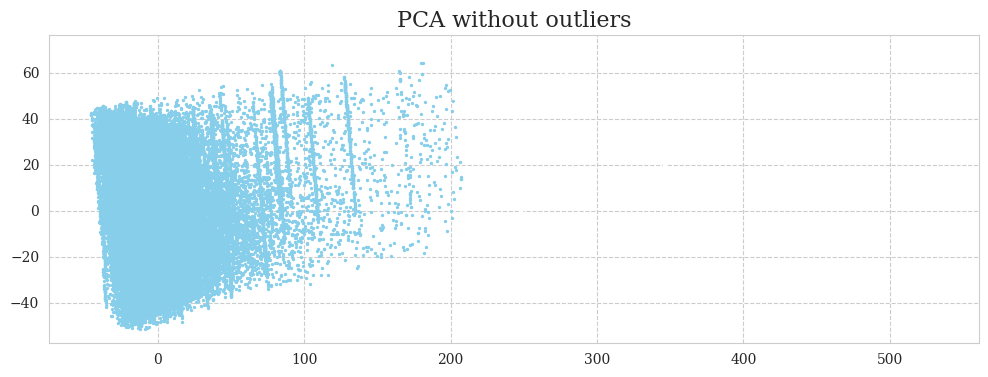

In [23]:
df_aqi_noanomalies = df_aqi.copy()
df_aqi_noanomalies.drop(list_final_outliers, inplace = True)
df_aqi_noanomalies = df_aqi_noanomalies.reset_index(drop = True)

X_train_noanomalies = df_aqi_noanomalies.iloc[:,1:9]
pca = PCA(n_components = 2)
X_train_noanomalies_pca = pca.fit_transform(X_train_noanomalies)

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_noanomalies_pca[:,0], X_train_noanomalies_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_final_pca[:,0], anomalies_final_pca[:,1], color = 'white', s = 2)
plt.title("PCA without outliers")
plt.show()

In [24]:
df_aqi_noanomalies.describe()

,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
count,70059.000000,70059.000000,70059.000000,70059.000000,70059.000000,70059.000000,70059.000000,70059.000000
mean,0.974334,0.023487,0.022870,40.569263,0.002719,22.327674,50.908637,2.887665
std,0.822299,0.016538,0.018471,30.157865,0.001802,5.028116,22.021566,2.176810
min,0.002100,0.000550,0.000000,-1.090000,0.000000,4.100000,1.800000,0.000000
25%,0.531000,0.011650,0.006980,20.940000,0.001640,19.000000,33.700000,1.300000
50%,0.759000,0.019700,0.019520,32.760000,0.002300,22.000000,50.100000,2.500000
75%,1.116000,0.031370,0.033900,51.105000,0.003630,25.800000,68.500000,4.000000
max,12.000000,0.335270,0.136950,248.050000,0.027220,38.000000,100.900000,20.400000


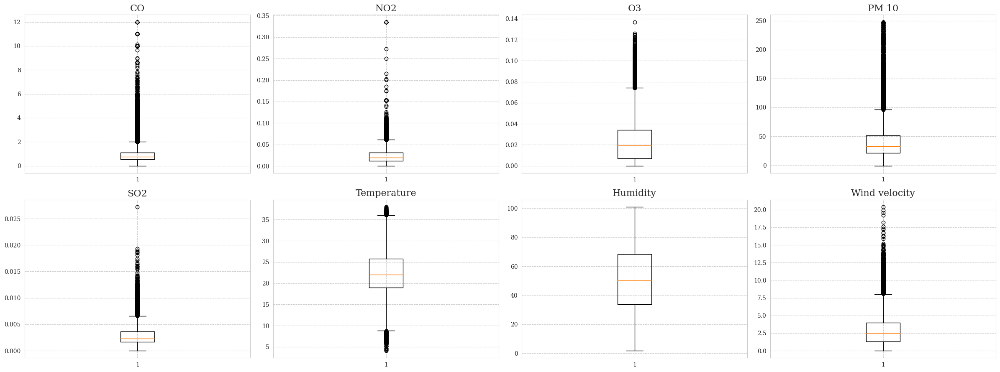

In [25]:
# Plotting histogram for each feature in dataset of values imputed with the mean to look deeper into the SO2 anomaly
list_values_noanomalies = [df_aqi_noanomalies.iloc[:,i].values for i in range(1,9)]

fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].boxplot(list_values_noanomalies[k])
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

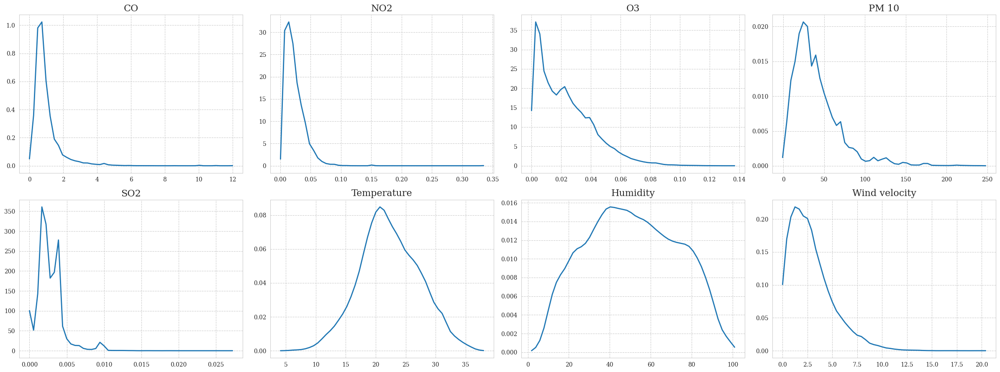

In [26]:
# Obtaining distribution of each feature using KDE method
list_x = []
list_y = []

for i in range(len(list_values_noanomalies)):
    kde = gaussian_kde(list_values_noanomalies[i])
    x = np.linspace(min(list_values_noanomalies[i]), max(list_values_noanomalies[i]), 50)
    list_x.append(x)
    list_y.append(kde(x))

# Plotting histogram for each feature in dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].plot(list_x[k], list_y[k], linewidth = 2)
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

In [27]:
df_aqi = df_aqi_noanomalies

# **<font color="#ffb94f">2.0 DATA VISUALIZATION</font>**

In [ ]:
# Grouping observations by individual days and monitoring point to end up with one record for each day and monitoring station
df_aqi_daily = df_aqi.groupby([df_aqi['Datetime'].dt.date, 'Station']).mean().reset_index()

df_aqi_daily.rename(columns={'Datetime':'Date'}, inplace=True)
df_aqi_daily

,Date,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,2016-01-01,Atemajac,1.382750,0.025950,0.018440,56.328333,0.001819,20.554167,61.054167,2.470833
1,2016-01-01,Las Aguilas,1.034125,0.022458,0.021056,31.462500,0.001260,20.191667,63.162500,2.291667
2,2016-01-01,Las Pintas,3.128083,0.022599,0.018680,41.210000,0.003420,22.470833,65.116667,0.983333
3,2016-01-01,Loma Dorada,1.612708,0.026988,0.014219,62.495417,0.002370,20.645833,63.020833,0.733333
4,2016-01-01,Miravalle,3.069958,0.030681,0.014287,106.371250,0.007043,22.000000,64.033333,1.529167
...,...,...,...,...,...,...,...,...,...,...
2921,2016-12-31,Loma Dorada,0.722417,0.024547,0.017811,54.915000,0.003164,20.500000,51.520833,1.150000
2922,2016-12-31,Miravalle,0.965667,0.018584,0.021539,70.020000,0.004180,22.250000,50.150000,3.333333
2923,2016-12-31,Oblatos,0.629875,0.016146,0.023151,41.210000,0.003478,22.712500,57.941667,3.975000
2924,2016-12-31,Tlaquepaque,0.673792,0.018029,0.017060,48.090000,0.001278,21.291667,46.004167,3.145833


In [ ]:
# Grouping observations by individual hours of the day and monitoring point to end up with one record for each day and monitoring station
df_aqi_hour = df_aqi.groupby([df_aqi['Datetime'].dt.hour, 'Station']).mean().reset_index()

df_aqi_hour.rename(columns={'Datetime':'Hour'}, inplace=True)
df_aqi_hour['Hour'] = df_aqi_hour['Hour'] + 1
df_aqi_hour

,Hour,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,1,Atemajac,0.952719,0.021528,0.016503,38.058634,0.001890,20.083880,55.086066,3.300000
1,1,Las Aguilas,0.702407,0.025992,0.018168,23.750109,0.001225,19.460383,57.080328,3.348634
2,1,Las Pintas,0.864422,0.024769,0.015322,50.042709,0.003645,21.389665,60.552514,1.791899
3,1,Loma Dorada,1.058716,0.029635,0.012056,42.266230,0.003450,20.026230,56.239891,1.131148
4,1,Miravalle,1.071407,0.023064,0.015369,60.338607,0.003317,21.414208,57.005738,2.018852
...,...,...,...,...,...,...,...,...,...,...
187,24,Loma Dorada,1.258787,0.033391,0.011377,46.129290,0.003583,20.737978,53.645082,1.346995
188,24,Miravalle,1.222885,0.024780,0.015457,60.905328,0.003458,22.103552,54.534973,2.490710
189,24,Oblatos,1.137987,0.023661,0.015888,37.550847,0.003811,22.021038,59.930055,3.423224
190,24,Tlaquepaque,1.337851,0.029781,0.011051,39.099617,0.002971,20.528689,51.091803,2.463661


In [ ]:
# Grouping observations by individual days of the week and monitoring point to end up with one record for each day and monitoring station
df_aqi_day_week = df_aqi.groupby([df_aqi['Datetime'].dt.dayofweek, 'Station']).mean().reset_index()

df_aqi_day_week.rename(columns={'Datetime':'Day of week'}, inplace=True)
df_aqi_day_week['Day of week'] = df_aqi_day_week['Day of week'] + 1
df_aqi_day_week.head()

,Day of week,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,1,Atemajac,1.142730,0.022365,0.023859,36.927011,0.001958,22.229567,48.392949,3.687340
1,1,Las Aguilas,0.867620,0.028415,0.024629,25.158077,0.001330,20.855529,52.509776,3.620433
2,1,Las Pintas,0.828927,0.023675,0.025450,53.672026,0.003672,23.444489,52.987358,1.854457
3,1,Loma Dorada,1.057943,0.025441,0.020661,36.356274,0.003563,21.656490,51.080128,1.445913
4,1,Miravalle,1.108853,0.023299,0.020328,67.448705,0.003310,22.900080,52.187530,2.527997


In [ ]:
 # Grouping observations by month and monitoring point to end up with one record for each month and monitoring station
df_aqi_monthly = df_aqi.groupby([df_aqi['Datetime'].dt.month, 'Station']).mean().reset_index()

calendar = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 
            'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
            
df_aqi_monthly.rename(columns={'Datetime':'Month'}, inplace=True)
df_aqi_monthly['Month'] = df_aqi_monthly['Month'].map(calendar)
df_aqi_monthly

,Month,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,Jan,Atemajac,1.283647,0.030374,0.022286,43.410645,0.002390,18.828763,44.575269,3.493817
1,Jan,Las Aguilas,0.936667,0.039953,0.022167,29.725833,0.001993,18.183065,45.434543,3.383199
2,Jan,Las Pintas,1.284858,0.021784,0.022853,45.499919,0.003533,20.427957,47.365591,1.681048
3,Jan,Loma Dorada,1.260448,0.030942,0.018374,36.923548,0.002947,18.570968,45.642083,1.267070
4,Jan,Miravalle,1.094779,0.020906,0.023331,86.289179,0.004511,21.219246,42.932571,3.464065
...,...,...,...,...,...,...,...,...,...,...
91,Dec,Loma Dorada,1.147560,0.029592,0.017498,48.055887,0.002582,20.115726,49.948118,1.004570
92,Dec,Miravalle,1.735974,0.029397,0.017659,69.022554,0.004065,21.371371,51.914113,2.041129
93,Dec,Oblatos,1.168621,0.025836,0.020163,49.008952,0.003751,21.989382,56.062769,2.746909
94,Dec,Tlaquepaque,1.441532,0.028261,0.016235,48.380727,0.002628,20.500000,47.129744,2.174697


In [ ]:
# Grouping observations by month and monitoring point to end up with one record for each month and monitoring station
df_aqi_total = df_aqi.groupby([df_aqi['Station']]).mean().reset_index()
df_aqi_total

,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,Atemajac,1.145981,0.022764,0.023060,37.911932,0.002009,22.231375,47.670571,3.749647
1,Las Aguilas,0.828487,0.029370,0.023886,26.091847,0.001356,20.929617,51.175325,3.707049
2,Las Pintas,0.837940,0.023180,0.024800,52.520242,0.003681,23.540563,52.058590,1.869105
3,Loma Dorada,1.026066,0.026368,0.019419,37.401337,0.003396,21.432616,51.252147,1.430248
4,Miravalle,1.051715,0.023125,0.020274,65.279030,0.003418,22.983383,51.233280,2.511817
5,Oblatos,0.935003,0.019447,0.023932,37.032746,0.003548,22.961774,56.514299,3.378553
6,Tlaquepaque,1.055158,0.024251,0.017807,36.343763,0.002431,21.876238,47.007327,2.760321
7,Vallarta,0.912040,0.019378,0.029814,32.267907,0.001931,22.690833,50.384320,3.676285


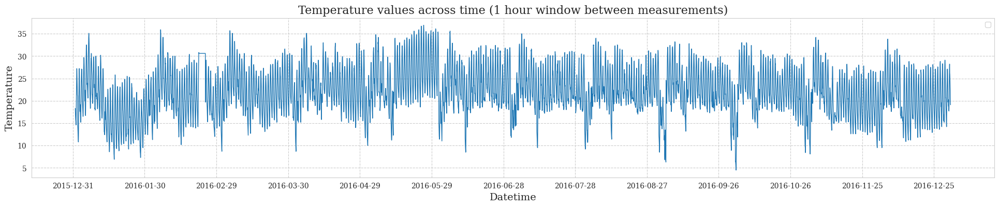

In [94]:
fig, ax = plt.subplots(figsize=(24, 4))
ax = sns.lineplot(data = df_aqi[df_aqi['Station'] == 'Atemajac'], x ='Datetime', y = 'Temperature', lw = 1)

ax.xaxis.set_major_locator(ticker.MultipleLocator(30))
plt.legend(bbox_to_anchor=(1, 1))
plt.title('Temperature values across time (1 hour window between measurements)')
plt.show()

<ipython-input-105-712e6b42e8ec>:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



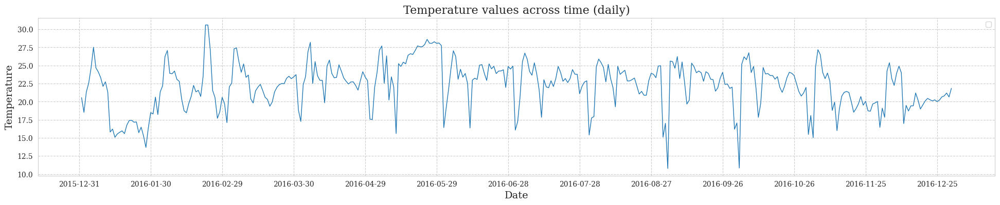

In [105]:
fig, ax = plt.subplots(figsize=(24, 4))
ax = sns.lineplot(data = df_aqi_daily[df_aqi_daily['Station'] == 'Atemajac'], x ='Date', y = 'Temperature', lw = 1)

ax.xaxis.set_major_locator(ticker.MultipleLocator(30))
plt.legend(bbox_to_anchor=(1, 1))
plt.title('Temperature values across time (daily)')
plt.show()

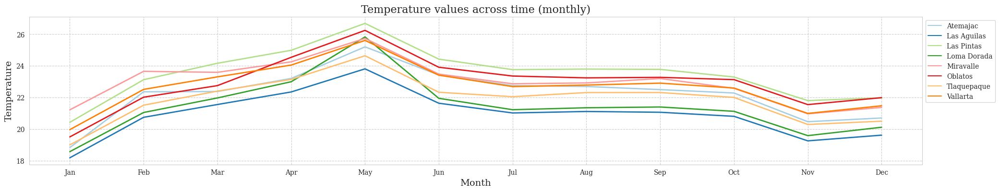

In [104]:
fig, ax = plt.subplots(figsize=(24, 4))
ax = sns.lineplot(data = df_aqi_monthly, x ='Month', y = 'Temperature',
                  hue = 'Station', palette = 'Paired',
                  legend = 'full', lw = 2)

ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.legend(bbox_to_anchor=(1, 1))
plt.title('Temperature values across time (monthly)')
plt.show()

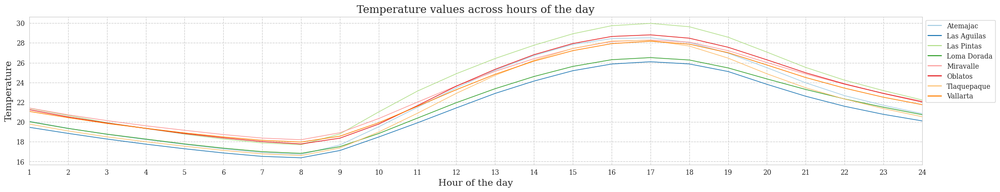

In [130]:
fig, ax = plt.subplots(figsize=(24, 4))
ax = sns.lineplot(data = df_aqi_hour, x = 'Hour', y = 'Temperature', hue = 'Station', palette = 'Paired', legend = 'full', lw = 1)

ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Hour of the day')
plt.xlim(1, 24)
plt.title('Temperature values across hours of the day')
plt.show()

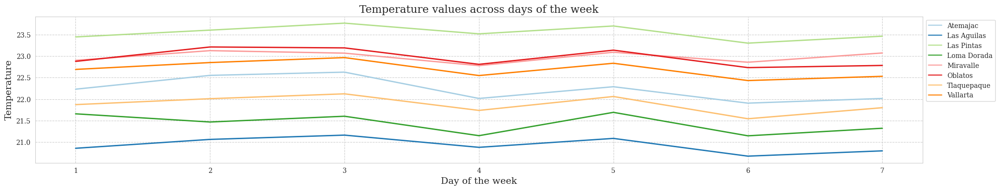

In [131]:
fig, ax = plt.subplots(figsize=(24, 4))
ax = sns.lineplot(data = df_aqi_day_week, x = 'Day of week' , y = 'Temperature', hue = 'Station', palette = 'Paired', legend = 'full', lw = 2)

ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Day of the week')
plt.title('Temperature values across days of the week')
plt.show()

In [98]:
#extract color palette, the palette can be changed
palette = list(sns.color_palette(palette = 'Paired', n_colors = len(list_monitor_station)).as_hex())

for feature in list_columns:
    fig = go.Figure()
    for station, p in zip(list_monitor_station, palette):
        fig.add_trace(go.Scatter(x = df_aqi_daily[df_aqi_daily['Station'] == station]['Date'],
                                y = df_aqi_daily[df_aqi_daily['Station'] == station][feature],
                                name = station,
                                line_color = p))
    fig.update_layout(title_text = '{} values across time (daily)'.format(feature), title_x = 0.5)
    fig.update_layout(autosize = False, width = 1400, height = 400,)
    fig.show()

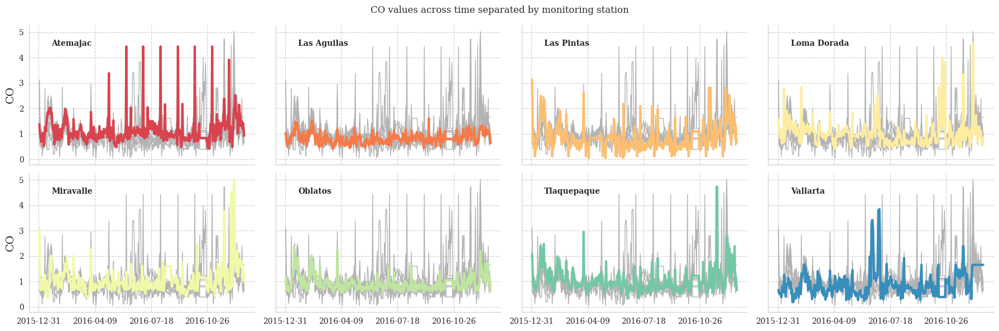

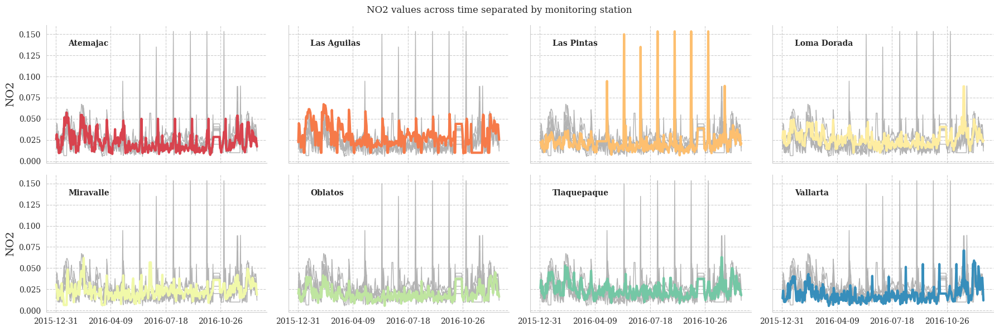

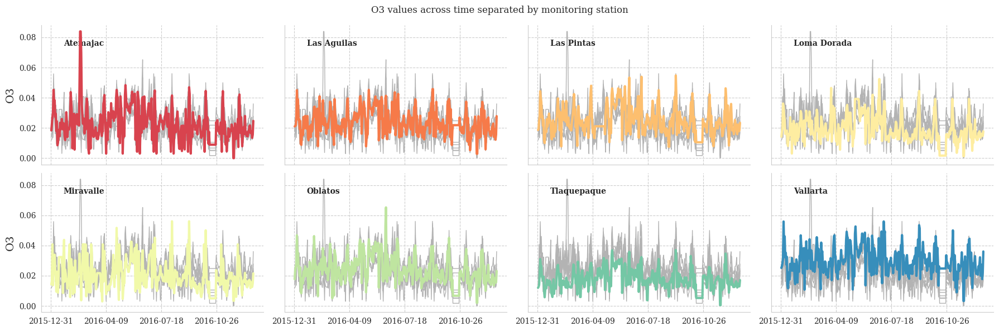

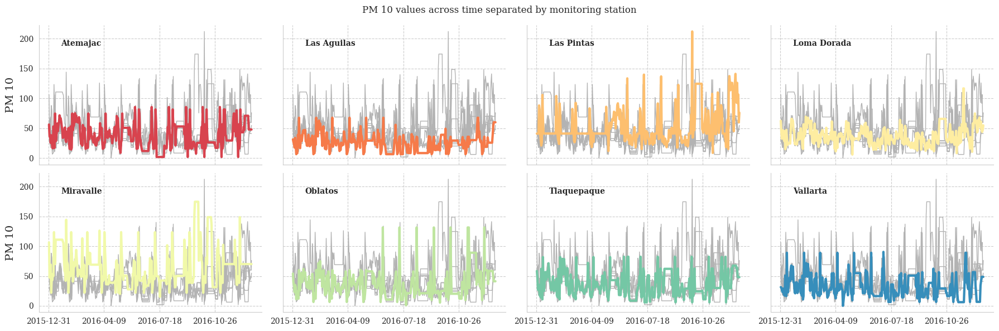

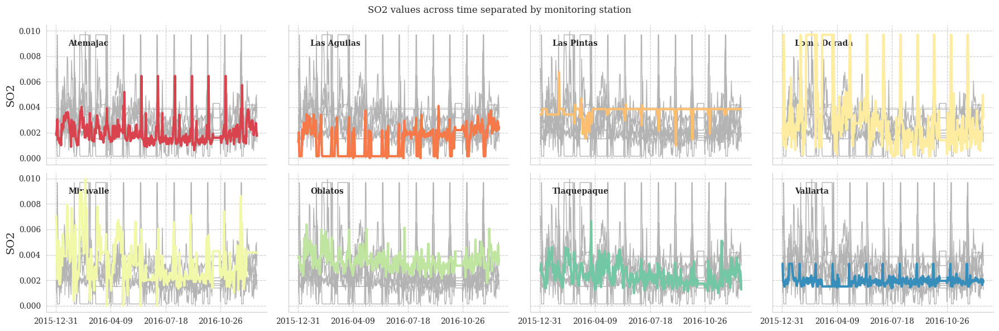

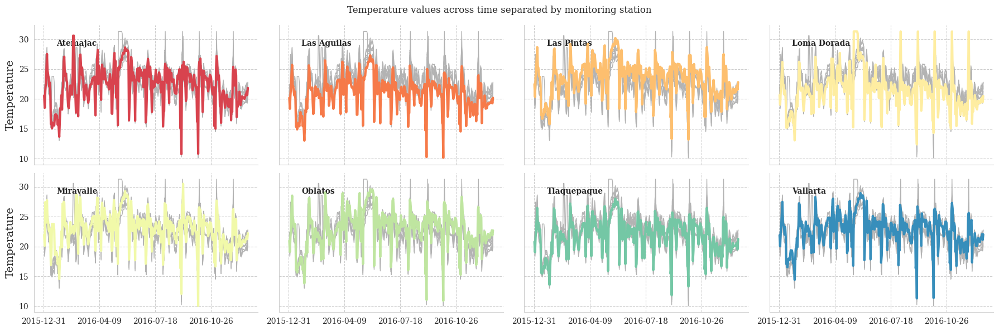

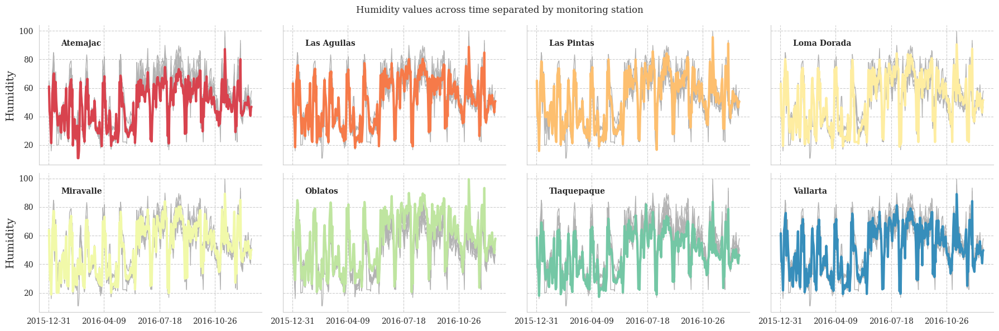

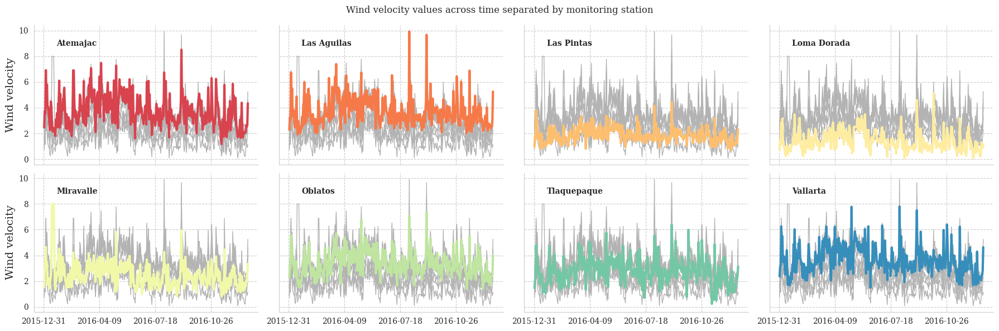

In [101]:
for feature in list_columns:
    grid = sns.relplot(data = df_aqi_daily, x = "Date", y = feature,
                      col = "Station", hue = "Station",
                      kind = "line", palette = "Spectral",   
                      linewidth = 3, zorder = 4, col_wrap = 4, 
                      height = 3, aspect = 1.5, legend = False)

    #add text and silhouettes
    for time, ax in grid.axes_dict.items():
        ax.text(.1, .85, time, transform = ax.transAxes, fontweight = "bold")
        sns.lineplot(data = df_aqi_daily, x = "Date", y = feature, units = "Station",
                    estimator = None, color= ".7", linewidth = 1, ax = ax)

    ax.xaxis.set_major_locator(ticker.MultipleLocator(100))
    grid.set_titles("")
    grid.fig.suptitle('{} values across time separated by monitoring station'.format(feature))
    grid.set_axis_labels("", "{}".format(feature))
    grid.tight_layout()

In [100]:
for feature in list_columns:
    fig = go.Figure()
    
    for station, p in zip(list_monitor_station, palette):
        fig.add_trace(go.Scatterpolar(r = df_aqi_monthly[df_aqi_monthly['Station'] == station][feature],
                                      theta = df_aqi_monthly[df_aqi_monthly['Station'] == station]['Month'],
                                      name = station, marker = dict(color = p)))
    fig.update_layout(title_text = '{} values across time (monthly)'.format(feature), title_x = 0.5)
    fig.update_layout(showlegend=True, width=600, height=500)
    fig.show()  

# **<font color="#ffb94f">3.0 DIMENSIONALITY REDUCTION</font>**

## **<font color="#84f745">3.1 PCA</font>**

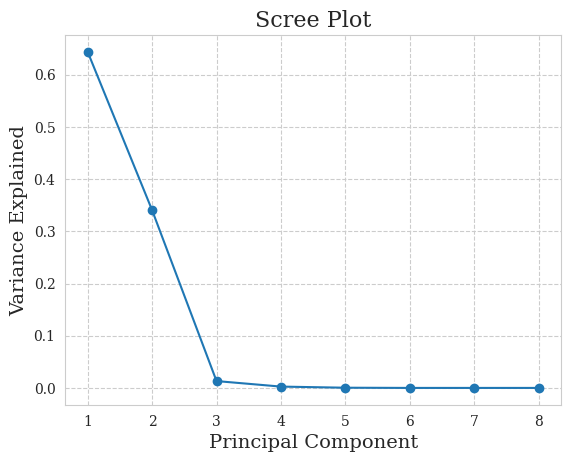

In [39]:
pca = PCA(n_components=8)
Principal_components=pca.fit_transform(X_train)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

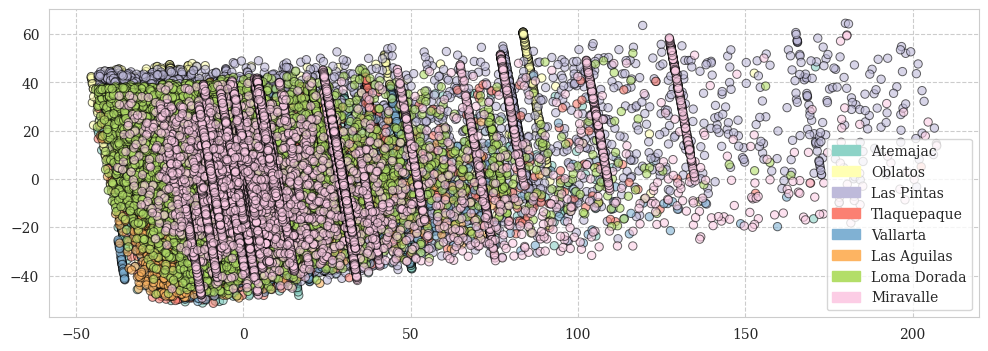

In [40]:
pca = PCA(n_components = 2)
X_train_pca = pca.fit_transform(X_train)

levels, categories = pd.factorize(df_aqi['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c = colors, edgecolor = 'k', alpha = .6, linewidth = .7)
plt.legend(handles=handles)
plt.show()

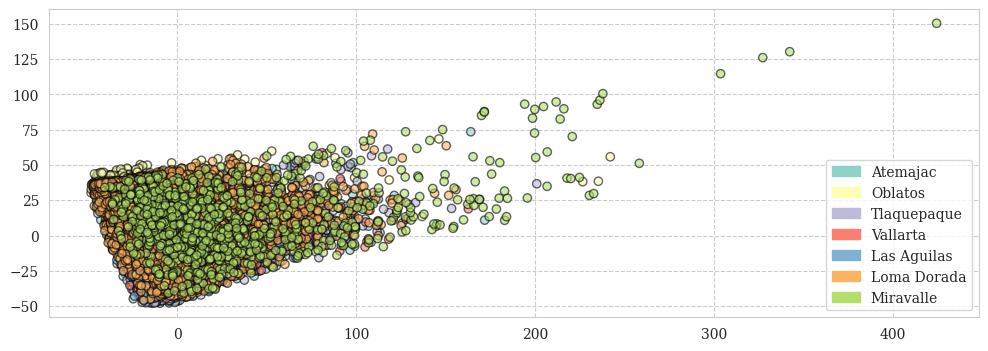

In [41]:
pca = PCA(n_components = 2)
X_train_pca_dropna = pca.fit_transform(X_train_dropna)

levels, categories = pd.factorize(df_aqi_dropna['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca_dropna[:, 0], X_train_pca_dropna[:, 1], c = colors, edgecolor = 'k', alpha = .6, linewidth = 1)
plt.legend(handles=handles)
plt.show()

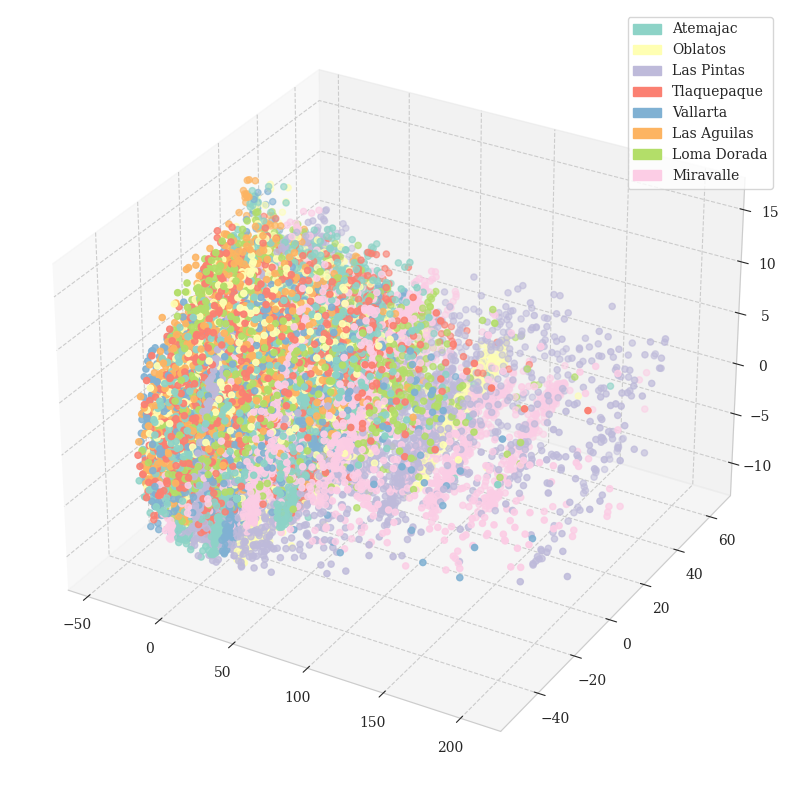

In [42]:
pca = PCA(n_components=3)
aqi_pca = pca.fit_transform(X_train)

x = aqi_pca[:, 0]
y = aqi_pca[:, 1]
z = aqi_pca[:, 2]

levels, categories = pd.factorize(df_aqi['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (15, 10))
fig.tight_layout()
ax = plt.axes(projection = "3d")
ax.scatter3D(x, y, z, c = colors)
plt.legend(handles=handles)
plt.show()

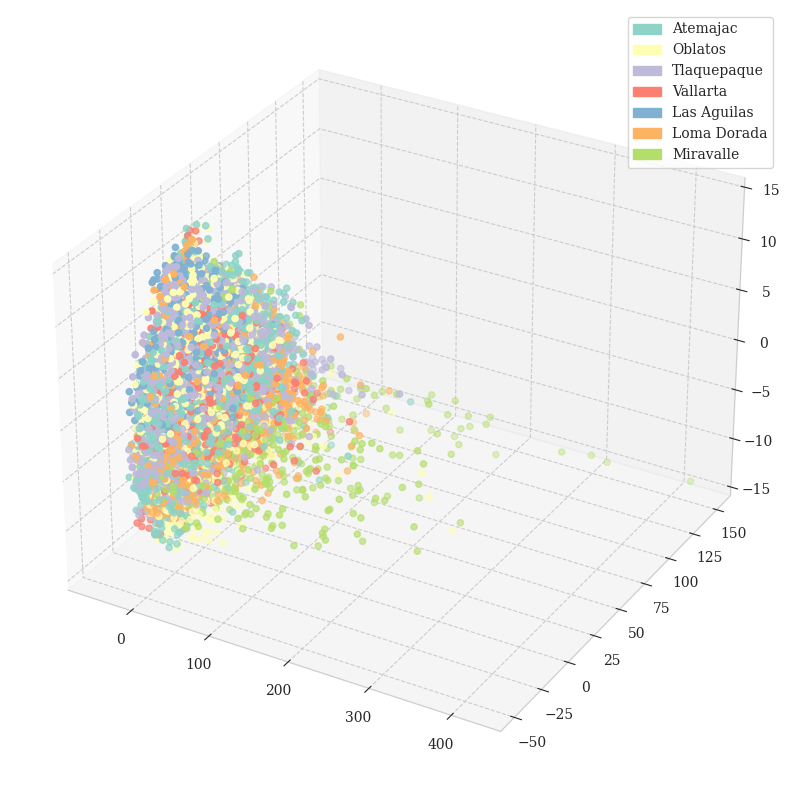

In [43]:
pca = PCA(n_components=3)
aqi_pca = pca.fit_transform(X_train_dropna)

x = aqi_pca[:, 0]
y = aqi_pca[:, 1]
z = aqi_pca[:, 2]

levels, categories = pd.factorize(df_aqi_dropna['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (15, 10))
fig.tight_layout()
ax = plt.axes(projection = "3d")
ax.scatter3D(x, y, z, c = colors)
plt.legend(handles=handles)
plt.show()

## **<font color="#84f745">3.2 GAUSSIAN RANDOM PROJECTION</font>**

Text(0.5, 1.0, 'Gaussian Random Projection')

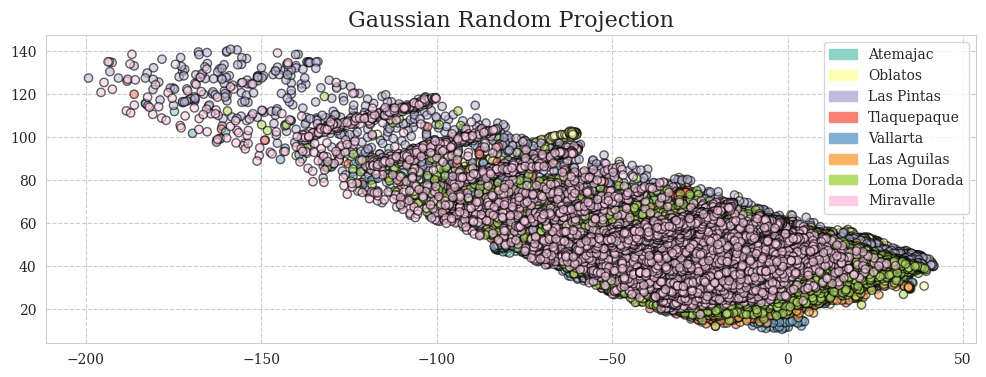

In [44]:
rsp = random_projection.GaussianRandomProjection(n_components = 2)
aqi_rsp = rsp.fit_transform(X_train)

levels, categories = pd.factorize(df_aqi['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (12, 4))
plt.scatter(aqi_rsp[:, 0], aqi_rsp[:, 1], c = colors, edgecolor = 'k', alpha = .6, linewidth = 1)
plt.legend(handles=handles)
plt.title("Gaussian Random Projection")

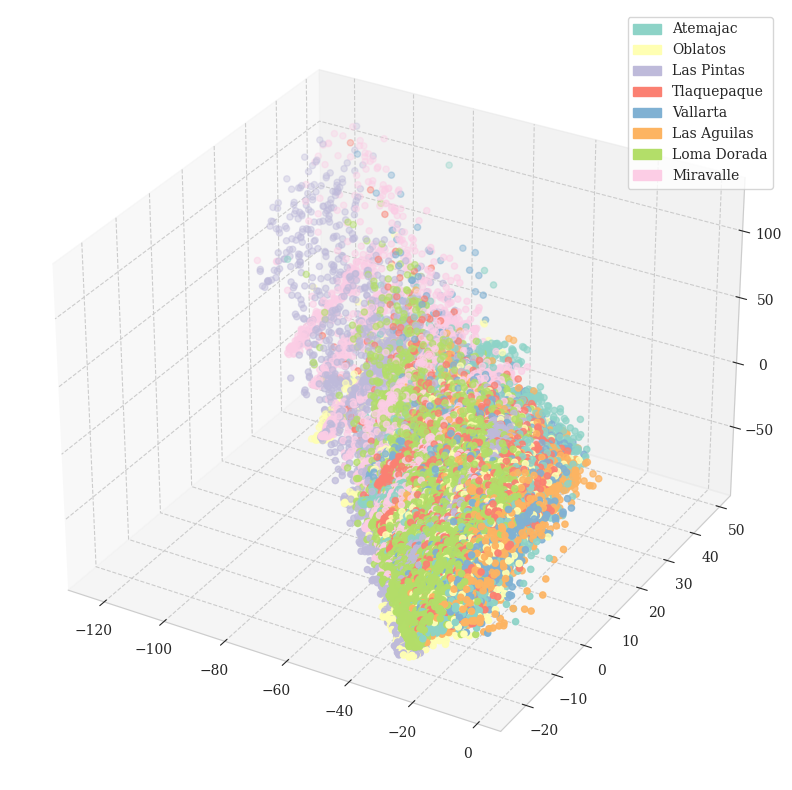

In [45]:
rsp = random_projection.GaussianRandomProjection(n_components = 3)
aqi_rsp = rsp.fit_transform(X_train)

x = aqi_rsp[:, 0]
y = aqi_rsp[:, 1]
z = aqi_rsp[:, 2]

levels, categories = pd.factorize(df_aqi['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (15, 10))
fig.tight_layout()
ax = plt.axes(projection = "3d")
ax.scatter3D(x, y, z, c = colors)
plt.legend(handles=handles)
plt.show()

# **<font color="#ffb94f">X.0 GEO</font>**

In [46]:
# Function to turn to geodataframe, used in get_voronoi_tessellation
def to_GeoDataFrame(region_polys):
    name=[]
    for i in range(1, len(region_polys) + 1):
        name.append('cell ' + str(i))
    gdf = gpd.GeoDataFrame(columns=['name','geometry'], crs={'init': 'epsg:4326'})
    gdf['name'] = name
    for index, row in gdf.iterrows():
        gdf.at[index, 'geometry'] = region_polys[index]
    return gdf

# Function to obtain voronoi tessellation from a set of points inside a polygon
def get_voronoi_tessellation(poly_ch, points):
    vor = Voronoi(points, qhull_options='Qbb Qc Qx')
    region_polys, region_pts = voronoi_regions_from_coords(points, poly_ch)
    tess_voronoi = to_GeoDataFrame(region_polys)
    return tess_voronoi

In [47]:
%%capture
# Official administrative divisions to use as tessellations for each geographical area
url_area = 'https://raw.githubusercontent.com/Bruno-Limon/air-quality-analysis/main/area-ZMG.geojson'

area_base = gpd.read_file(url_area)
area_merged = gpd.GeoSeries(unary_union(area_base['geometry']))

# Points to build voronoi tessellation, locations of monitoring stations
dict_station_coord = {'Las Aguilas': (20.630983, -103.416735),
                    #  'Santa Fe': (20.528954, -103.377180),
                     'Atemajac': (20.719626, -103.355412),
                     'Vallarta': (20.680141, -103.398572),
                     'Tlaquepaque': (20.640941, -103.312497),
                     'Oblatos': (20.700501, -103.296648),
                     'Loma Dorada': (20.631665, -103.256809),
                    #  'Centro': (20.673844, -103.333243),
                     'Miravalle': (20.614511, -103.343352),
                     'Las Pintas': (20.576708, -103.326533)}

# Loading official city boundaries                     
official_tessellation = gpd.read_file(url_area)
official_tessellation.insert(0, 'tile_ID', range(0, len(official_tessellation)))
official_tessellation['mun_name'] = official_tessellation['mun_name'].str[0]
official_tessellation = official_tessellation.set_crs({'init': 'epsg:4326'}, allow_override=True)

# Creating polygon of city boundaries for each area using shapely's function unary_union
area_boundary = unary_union(area_base.geometry)
area_boundary

voronoi_points = []
for caseta, (lat, lng) in dict_station_coord.items():
    voronoi_points.append([lng, lat])
voronoi_points = np.array(voronoi_points)
points_gdf = gpd.GeoDataFrame(geometry = gpd.points_from_xy(voronoi_points[:,0], voronoi_points[:,1]))

voronoi_tessellation = get_voronoi_tessellation(area_boundary, voronoi_points)
voronoi_tessellation['Station'] = [caseta for caseta, (lat, lng) in dict_station_coord.items()]
voronoi_tessellation['lat'] = [lat for caseta, (lat, lng) in dict_station_coord.items()]
voronoi_tessellation['lng'] = [lng for caseta, (lat, lng) in dict_station_coord.items()]
voronoi_tessellation = voronoi_tessellation.set_crs({'init': 'epsg:4326'}, allow_override=True)
voronoi_tessellation = voronoi_tessellation.explode().reset_index(drop = True)
voronoi_tessellation = voronoi_tessellation.drop([1, 2]).reset_index(drop = True)

In [48]:
official_tessellation.head()

,tile_ID,geo_point_2d,year,sta_code,sta_name,mun_code,mun_name,mun_area_code,mun_type,geometry
0,0,"{'lon': -103.20737336529787, 'lat': 20.3916398...",2022,[14],[Jalisco],[14044],Ixtlahuacán de los Membrillos,MEX,municipio,"POLYGON ((-103.12160 20.40552, -103.13283 20.4..."
1,1,"{'lon': -103.04883967584755, 'lat': 20.6360458...",2022,[14],[Jalisco],[14124],Zapotlanejo,MEX,municipio,"POLYGON ((-103.02471 20.79245, -103.02581 20.7..."
2,2,"{'lon': -103.13520885864084, 'lat': 20.4817194...",2022,[14],[Jalisco],[14051],Juanacatlán,MEX,municipio,"POLYGON ((-103.08099 20.48770, -103.08233 20.4..."
3,3,"{'lon': -103.24545860157885, 'lat': 20.5390308...",2022,[14],[Jalisco],[14070],El Salto,MEX,municipio,"POLYGON ((-103.25425 20.56486, -103.26769 20.5..."
4,4,"{'lon': -103.3478445479885, 'lat': 20.59148370...",2022,[14],[Jalisco],[14098],San Pedro Tlaquepaque,MEX,municipio,"POLYGON ((-103.28223 20.64118, -103.29058 20.6..."


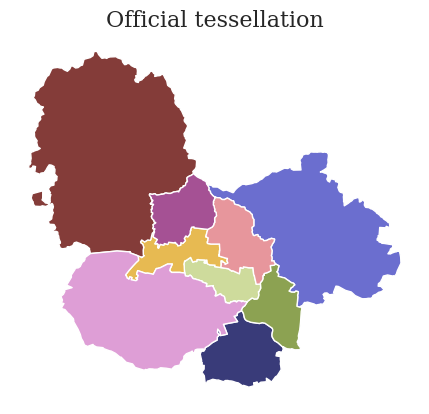

In [49]:
tess_color = "tab20b"
official_tessellation.plot(cmap = tess_color)
plt.title('Official tessellation')
plt.axis('off')
plt.show()

In [50]:
voronoi_tessellation

,name,Station,lat,lng,geometry
0,cell 1,Las Aguilas,20.630983,-103.416735,"POLYGON ((-103.31235 20.75266, -103.31014 20.7..."
1,cell 2,Atemajac,20.719626,-103.355412,"POLYGON ((-103.28001 20.66418, -103.10554 20.7..."
2,cell 3,Vallarta,20.680141,-103.398572,"POLYGON ((-103.61597 20.96111, -103.61561 20.9..."
3,cell 4,Tlaquepaque,20.640941,-103.312497,"POLYGON ((-103.35571 20.66016, -103.30994 20.6..."
4,cell 5,Oblatos,20.700501,-103.296648,"POLYGON ((-103.39181 20.57031, -103.30994 20.6..."
5,cell 6,Loma Dorada,20.631665,-103.256809,"POLYGON ((-103.37536 20.64363, -103.39181 20.5..."
6,cell 7,Miravalle,20.614511,-103.343352,"POLYGON ((-103.35571 20.66016, -103.35070 20.6..."
7,cell 8,Las Pintas,20.576708,-103.326533,"POLYGON ((-103.61083 20.73063, -103.61074 20.7..."


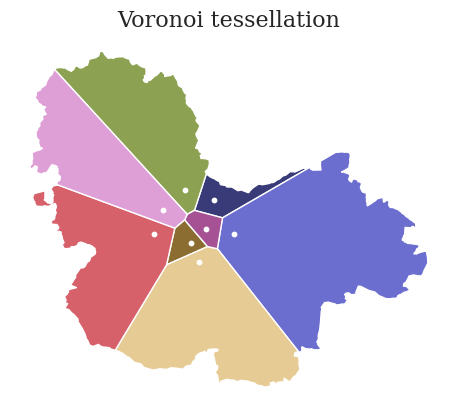

In [51]:
tess_color = "tab20b"
fig, ax = plt.subplots(nrows=1, ncols=1) 
voronoi_tessellation.plot(ax = ax, cmap = tess_color)
points_gdf.plot(ax = ax, color = 'white', markersize = 10)
ax.axis('off')
plt.title('Voronoi tessellation')
plt.show()

In [56]:
gdf_merged = voronoi_tessellation.set_index('Station').join(df_aqi_total.set_index('Station')).reset_index()
gdf_merged

,Station,name,lat,lng,geometry,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,Las Aguilas,cell 1,20.630983,-103.416735,"POLYGON ((-103.31235 20.75266, -103.31014 20.7...",0.828487,0.029370,0.023886,26.091847,0.001356,20.929617,51.175325,3.707049
1,Atemajac,cell 2,20.719626,-103.355412,"POLYGON ((-103.28001 20.66418, -103.10554 20.7...",1.145981,0.022764,0.023060,37.911932,0.002009,22.231375,47.670571,3.749647
2,Vallarta,cell 3,20.680141,-103.398572,"POLYGON ((-103.61597 20.96111, -103.61561 20.9...",0.912040,0.019378,0.029814,32.267907,0.001931,22.690833,50.384320,3.676285
3,Tlaquepaque,cell 4,20.640941,-103.312497,"POLYGON ((-103.35571 20.66016, -103.30994 20.6...",1.055158,0.024251,0.017807,36.343763,0.002431,21.876238,47.007327,2.760321
4,Oblatos,cell 5,20.700501,-103.296648,"POLYGON ((-103.39181 20.57031, -103.30994 20.6...",0.935003,0.019447,0.023932,37.032746,0.003548,22.961774,56.514299,3.378553
5,Loma Dorada,cell 6,20.631665,-103.256809,"POLYGON ((-103.37536 20.64363, -103.39181 20.5...",1.026066,0.026368,0.019419,37.401337,0.003396,21.432616,51.252147,1.430248
6,Miravalle,cell 7,20.614511,-103.343352,"POLYGON ((-103.35571 20.66016, -103.35070 20.6...",1.051715,0.023125,0.020274,65.279030,0.003418,22.983383,51.233280,2.511817
7,Las Pintas,cell 8,20.576708,-103.326533,"POLYGON ((-103.61083 20.73063, -103.61074 20.7...",0.837940,0.023180,0.024800,52.520242,0.003681,23.540563,52.058590,1.869105


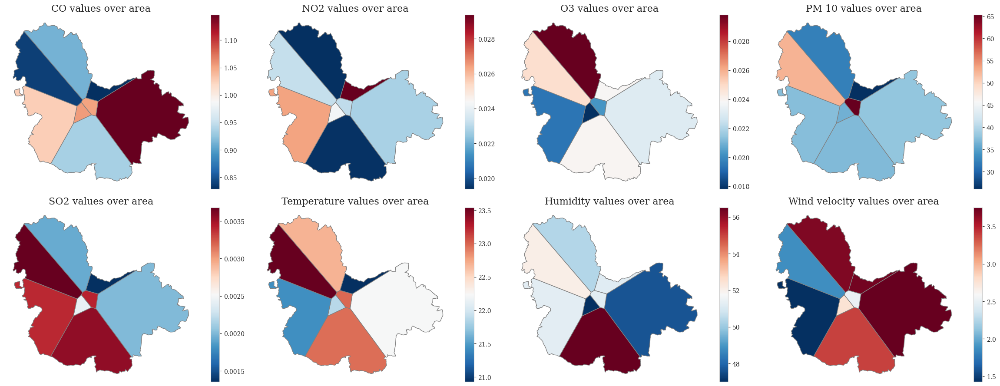

In [57]:
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        gdf_merged.plot(ax = ax[i,j], column = list_columns[k], cmap = 'RdBu_r', linewidth = 1, edgecolor = 'gray')
        ax[i,j].set(title = list_columns[k] + ' values over area')
        ax[i,j].axis('off')
        sm = plt.cm.ScalarMappable(cmap = 'RdBu_r', norm = plt.Normalize(vmin = min(gdf_merged[list_columns[k]]), vmax = max(gdf_merged[list_columns[k]])))
        fig.colorbar(sm, ax = ax[i,j])
        fig.tight_layout()
        k += 1

In [72]:
# Visualizing trajectories flowing through Area 3
map_f = folium.Map(location = [20.66682, -103.39182], zoom_start = 10, tiles = 'CartoDB positron')

# Outlining official tessellation and adding name of counties as folium popup
for _, row in gdf_merged.iterrows():
    sim_geo = gpd.GeoSeries(row['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data = geo_j, style_function = lambda x: {'fillColor': 'None', 'color': 'Blue'})
    folium.Circle([row['lat'], row['lng']], radius = 2000, weight = 1).add_to(geo_j)
    folium.CircleMarker([row['lat'], row['lng']], radius = 1, weight = 5, color = 'blue').add_to(geo_j)
    geo_j.add_to(map_f)

map_f

# **<font color="#ffb94f">5.0 REGRESSION</font>**

Number of CPUs in the system: 2


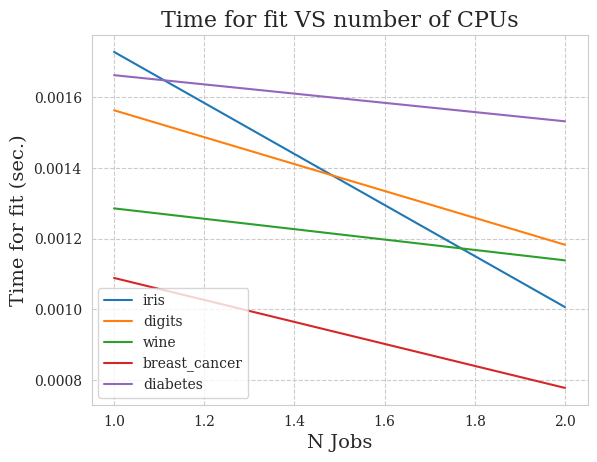

In [ ]:
import os
import time
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import *
import matplotlib.pyplot as plt
import pandas as pd

datasets_list = ['iris', 'digits', 'wine', 'breast_cancer','diabetes']

n_cpu = os.cpu_count()
print("Number of CPUs in the system:", n_cpu)

parameters = {  'n_neighbors'   : np.arange(2, 25),
                'weights'       : ['uniform', 'distance'],
                'metric'        : ['euclidean', 'manhattan', 
                                   'chebyshev', 'minkowski'],
                'algorithm'     : ['ball_tree', 'kd_tree']
            }

def load_and_train(name):
    dataset = globals()['load_' + name]()
    X = dataset.data
    y = dataset.target

    tdelta_list = []
    for i in range(1, n_cpu+1):
        s = time.time()
        model = KNeighborsClassifier(n_jobs = i)
        clf = GridSearchCV(model, parameters, cv = 10)
        model.fit(X, y)
        e = time.time()
        tdelta = e - s 
        tdelta_list.append({'time' : tdelta, 'bin' : i})
    return tdelta_list

for d in datasets_list:
    tdelta_list = load_and_train(d)
    df = pd.DataFrame(tdelta_list)
    plt.plot(df['bin'], df['time'], label = d)

plt.legend(loc = 'best')
plt.xlabel('N Jobs')
plt.ylabel('Time for fit (sec.)')
plt.title('Time for fit VS number of CPUs')
plt.show()

# **<font color="#ffb94f">6.0 TIME SERIES ANALYSIS</font>**